In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from scipy import stats as st
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [2]:
spending = pd.read_csv('student_spending.csv')

In [5]:
spending.head(5)

,Unnamed: 0,age,gender,year_in_school,major,monthly_income,financial_aid,tuition,housing,food,transportation,books_supplies,entertainment,personal_care,technology,health_wellness,miscellaneous,preferred_payment_method
0,0,19,Non-binary,Freshman,Psychology,958,270,5939,709,296,123,188,41,78,134,127,72,Credit/Debit Card
1,1,24,Female,Junior,Economics,1006,875,4908,557,365,85,252,74,92,226,129,68,Credit/Debit Card
2,2,24,Non-binary,Junior,Economics,734,928,3051,666,220,137,99,130,23,239,112,133,Cash
3,3,23,Female,Senior,Computer Science,617,265,4935,652,289,114,223,99,30,163,105,55,Mobile Payment App
4,4,20,Female,Senior,Computer Science,810,522,3887,825,372,168,194,48,71,88,71,104,Credit/Debit Card


In [16]:
spending.shape

(1000, 18)

In [6]:
spending.columns

Index(['Unnamed: 0', 'age', 'gender', 'year_in_school', 'major',
       'monthly_income', 'financial_aid', 'tuition', 'housing', 'food',
       'transportation', 'books_supplies', 'entertainment', 'personal_care',
       'technology', 'health_wellness', 'miscellaneous',
       'preferred_payment_method'],
      dtype='object')

In [11]:
spending.columns.values[0] = 'entry'

In [12]:
spending.columns

Index(['entry', 'age', 'gender', 'year_in_school', 'major', 'monthly_income',
       'financial_aid', 'tuition', 'housing', 'food', 'transportation',
       'books_supplies', 'entertainment', 'personal_care', 'technology',
       'health_wellness', 'miscellaneous', 'preferred_payment_method'],
      dtype='object')

In [41]:
spending.agg(['unique']).T

,unique
entry,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
age,"[19, 24, 23, 20, 25, 22, 18, 21]"
gender,"[Non-binary, Female, Male]"
year_in_school,"[Freshman, Junior, Senior, Sophomore]"
major,"[Psychology, Economics, Computer Science, Engi..."
monthly_income,"[958, 1006, 734, 617, 810, 523, 1354, 631, 140..."
financial_aid,"[270, 875, 928, 265, 522, 790, 69, 748, 248, 7..."
tuition,"[5939, 4908, 3051, 4935, 3887, 3151, 4973, 396..."
housing,"[709, 557, 666, 652, 825, 413, 812, 571, 599, ..."
food,"[296, 365, 220, 289, 372, 386, 398, 269, 354, ..."


In [20]:
spending.agg(['count']).values

array([[1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000,
        1000, 1000, 1000, 1000, 1000, 1000, 1000]], dtype=int64)

In [39]:
spending.major.unique()

array(['Psychology', 'Economics', 'Computer Science', 'Engineering',
       'Biology'], dtype=object)

In [55]:
spending._get_numeric_data().columns

Index(['entry', 'age', 'monthly_income', 'financial_aid', 'tuition', 'housing',
       'food', 'transportation', 'books_supplies', 'entertainment',
       'personal_care', 'technology', 'health_wellness', 'miscellaneous'],
      dtype='object')

In [64]:
spending._get_numeric_data().agg(['min','max','mean','median','var','std','sem']).T

,min,max,mean,median,var,std,sem
entry,0.0,999.0,499.500,499.5,83416.666667,288.819436,9.133273
age,18.0,25.0,21.675,22.0,5.394770,2.322664,0.073449
monthly_income,501.0,1500.0,1020.650,1021.0,86342.628128,293.841161,9.292073
financial_aid,0.0,1000.0,504.771,513.0,82422.146706,287.092575,9.078664
tuition,3003.0,6000.0,4520.395,4547.5,740732.097072,860.657944,27.216394
housing,401.0,1000.0,696.006,704.5,29315.815780,171.218620,5.414408
food,100.0,400.0,252.642,255.0,7560.234070,86.949606,2.749588
transportation,50.0,200.0,124.637,123.0,1897.298530,43.557990,1.377425
books_supplies,50.0,300.0,174.761,175.0,5242.414293,72.404518,2.289632
entertainment,20.0,150.0,84.814,86.0,1441.755159,37.970451,1.200731


<Axes: >

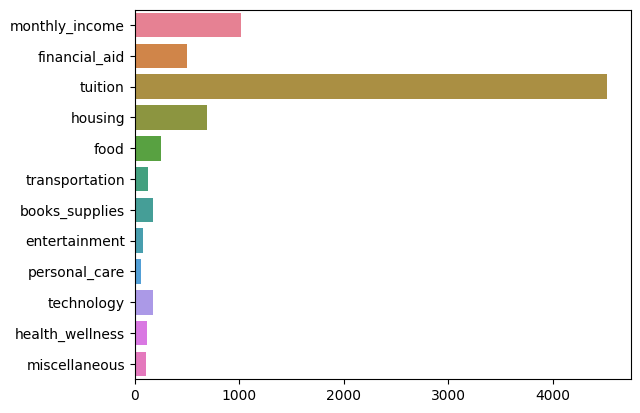

In [359]:
sns.barplot(spending._get_numeric_data().drop(['entry', 'age'], axis = 1), estimator = 'mean', errorbar = None, orient = 'y')

<Axes: >

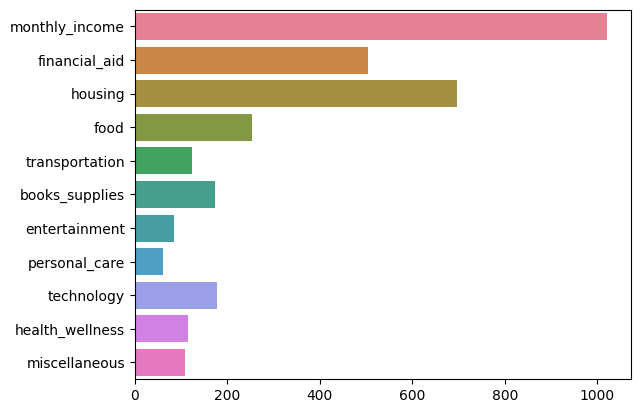

In [364]:
sns.barplot(spending._get_numeric_data().drop(['entry', 'age', 'tuition'], axis = 1), estimator = 'mean', errorbar = None, orient = 'y')

In [160]:
for i in spending.groupby(['preferred_payment_method', 'major']):
    print(i[0])

('Cash', 'Biology')
('Cash', 'Computer Science')
('Cash', 'Economics')
('Cash', 'Engineering')
('Cash', 'Psychology')
('Credit/Debit Card', 'Biology')
('Credit/Debit Card', 'Computer Science')
('Credit/Debit Card', 'Economics')
('Credit/Debit Card', 'Engineering')
('Credit/Debit Card', 'Psychology')
('Mobile Payment App', 'Biology')
('Mobile Payment App', 'Computer Science')
('Mobile Payment App', 'Economics')
('Mobile Payment App', 'Engineering')
('Mobile Payment App', 'Psychology')


### Z score = (x - mean(x))/std(x)

<Axes: ylabel='Density'>

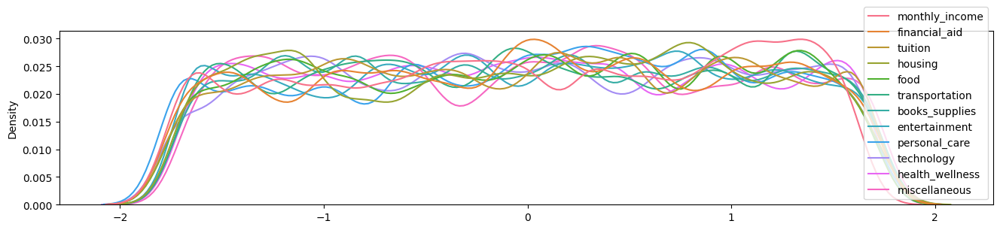

In [234]:
plt.subplots(figsize=(16, 3))
sns.kdeplot(data=st.zscore(spending.loc[:,['monthly_income', 'financial_aid', 'tuition', 'housing', 'food',
       'transportation', 'books_supplies', 'entertainment', 'personal_care',
       'technology', 'health_wellness', 'miscellaneous']]), multiple='layer', bw_method=0.1)

<Axes: ylabel='Density'>

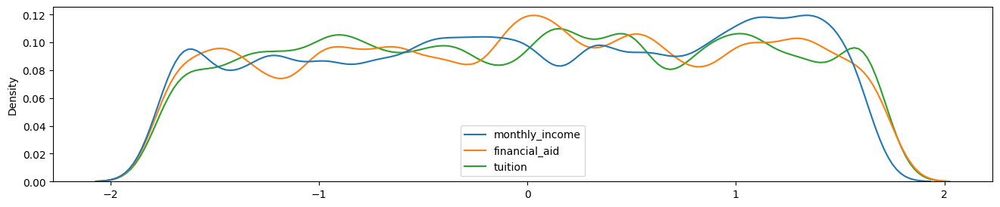

In [303]:
plt.subplots(figsize=(16, 3))
sns.kdeplot(data=st.zscore(spending.loc[:,['monthly_income', 'financial_aid', 'tuition']]), multiple='layer', bw_method=0.1)

<Axes: ylabel='Density'>

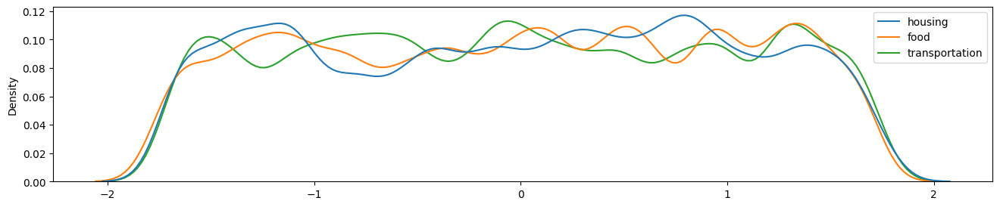

In [304]:
plt.subplots(figsize=(16, 3))
sns.kdeplot(data=st.zscore(spending.loc[:,['housing', 'food', 'transportation']]), multiple='layer', bw_method=0.1)

<Axes: ylabel='Density'>

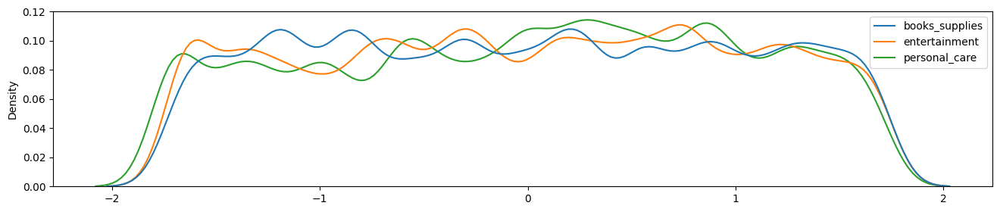

In [306]:
plt.subplots(figsize=(16, 3))
sns.kdeplot(data=st.zscore(spending.loc[:,['books_supplies', 'entertainment', 'personal_care']]), multiple='layer', bw_method=0.1)

<Axes: ylabel='Density'>

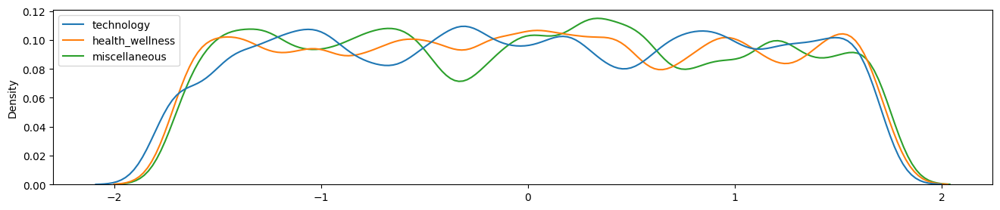

In [307]:
plt.subplots(figsize=(16, 3))
sns.kdeplot(data=st.zscore(spending.loc[:,['technology', 'health_wellness', 'miscellaneous']]), multiple='layer', bw_method=0.1)

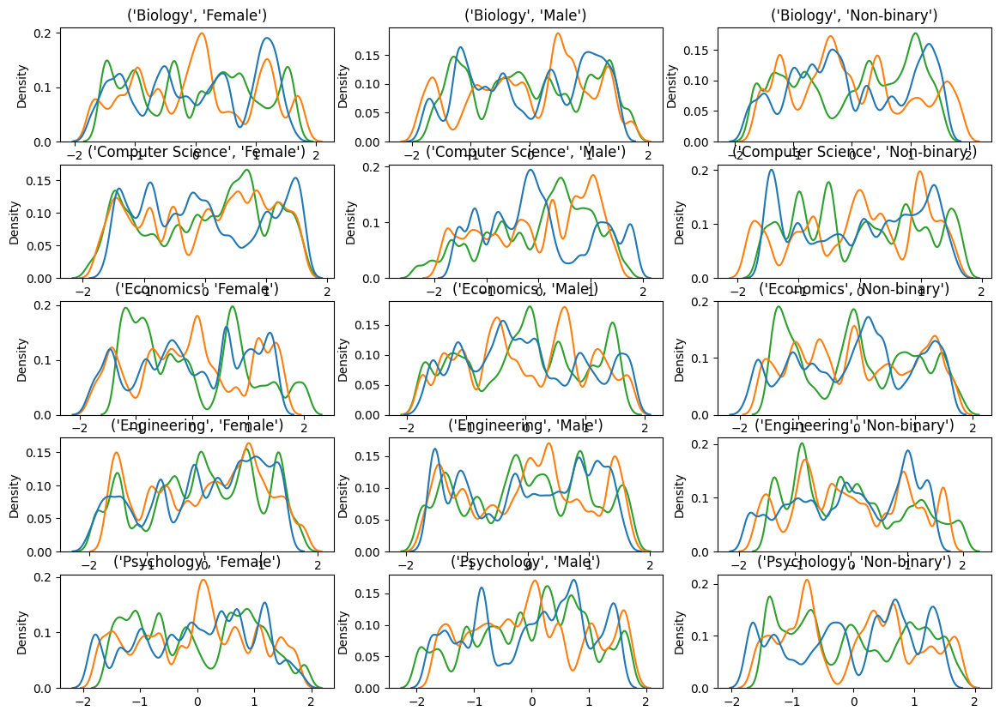

In [310]:
groups = spending.groupby(['major','gender'])
plotcols = 3
fig, axs = plt.subplots(groups.ngroups//plotcols, plotcols, figsize=(14, 10))
j=0
for i in groups:
    sns.kdeplot(data=st.zscore(i[1]._get_numeric_data()[['monthly_income', 'financial_aid', 'housing']]), multiple='layer',
                ax = axs[j//plotcols,j%plotcols], legend=False, bw_method = 0.1)
    axs[j//plotcols,j%plotcols].set_title(i[0])
    j+=1

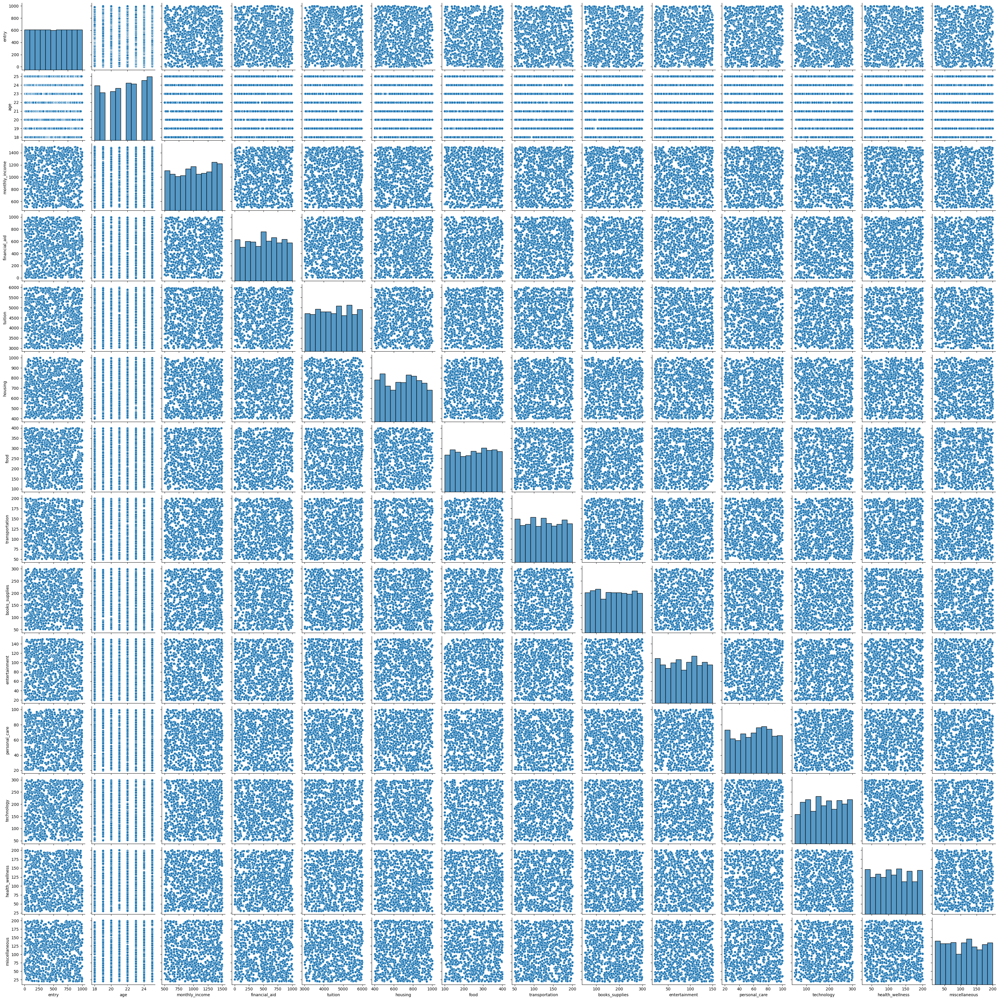

In [196]:
sns.pairplot(spending._get_numeric_data())

In [198]:
spending._get_numeric_data().corr()

,entry,age,monthly_income,financial_aid,tuition,housing,food,transportation,books_supplies,entertainment,personal_care,technology,health_wellness,miscellaneous
entry,1.000000,-0.000604,0.009057,0.016293,-0.010434,0.008444,0.001189,-0.043872,0.045192,0.002953,-0.019036,0.021718,0.003023,0.025077
age,-0.000604,1.000000,-0.015448,-0.022263,0.037042,0.023288,0.029906,-0.015375,0.025567,0.060446,-0.052414,0.005633,-0.025031,0.003904
monthly_income,0.009057,-0.015448,1.000000,0.037050,-0.000149,0.004471,-0.018521,0.046152,0.003527,0.024454,0.006842,0.010084,-0.032567,-0.023902
financial_aid,0.016293,-0.022263,0.037050,1.000000,0.008536,-0.008199,0.017463,0.017674,-0.048570,0.014249,-0.010427,0.017912,0.024430,-0.002977
tuition,-0.010434,0.037042,-0.000149,0.008536,1.000000,-0.020992,-0.019216,0.036734,-0.009433,-0.036925,-0.039074,-0.007864,0.010978,-0.014844
housing,0.008444,0.023288,0.004471,-0.008199,-0.020992,1.000000,-0.038335,-0.001975,-0.009936,0.021142,0.014577,-0.017230,-0.006323,0.013337
food,0.001189,0.029906,-0.018521,0.017463,-0.019216,-0.038335,1.000000,-0.003443,0.075485,0.012960,0.047422,0.034033,-0.003700,0.005192
transportation,-0.043872,-0.015375,0.046152,0.017674,0.036734,-0.001975,-0.003443,1.000000,0.012900,0.008505,0.048892,-0.003910,0.024824,0.032136
books_supplies,0.045192,0.025567,0.003527,-0.048570,-0.009433,-0.009936,0.075485,0.012900,1.000000,0.004742,-0.037669,0.019464,0.000030,-0.001294
entertainment,0.002953,0.060446,0.024454,0.014249,-0.036925,0.021142,0.012960,0.008505,0.004742,1.000000,-0.023282,0.012152,-0.032671,-0.019109


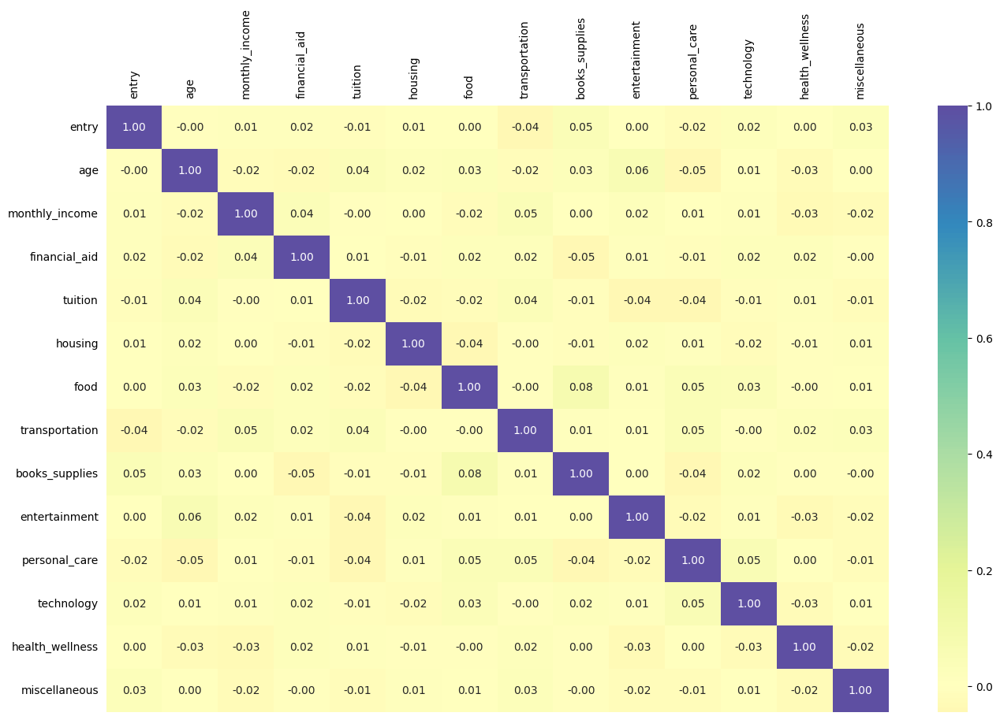

In [221]:
plt.subplots(figsize=(16, 10))
sns.heatmap(spending._get_numeric_data().corr(), annot=True, center = 0, fmt='.2f', cmap = 'Spectral')
plt.tick_params(labeltop = True, labelbottom=False, bottom = False, left = False)
plt.xticks(rotation = 90)
plt.yticks(rotation = 0)
plt.show()

In [267]:
mod = smf.ols('tuition ~ monthly_income', data = spending)
mod.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                tuition   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                 2.204e-05
Date:                Sat, 20 Apr 2024   Prob (F-statistic):              0.996
Time:                        22:49:12   Log-Likelihood:                -8176.1
No. Observations:                1000   AIC:                         1.636e+04
Df Residuals:                     998   BIC:                         1.637e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       4520.8393     98.470     45.911      0.000    4327.607    4714.071
monthly_income    -0.0004      0.093     -0.005      0.996      -0.182       0.182
==============================================================================
Omnibus:                      626.854   Durbin-Watson:                   2.102
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               57.971
Skew:                          -0.012   Prob(JB):                     2.58e-13
Kurtosis:                       1.821   Cond. No.                     3.84e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.84e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<Axes: xlabel='tuition', ylabel='monthly_income'>

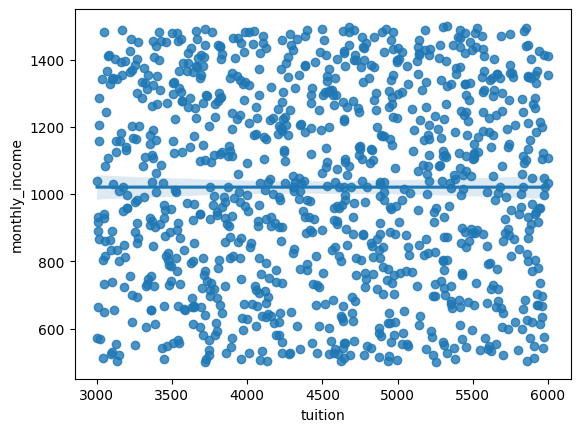

In [246]:
sns.regplot(data=spending, x='monthly income', y='tuition')

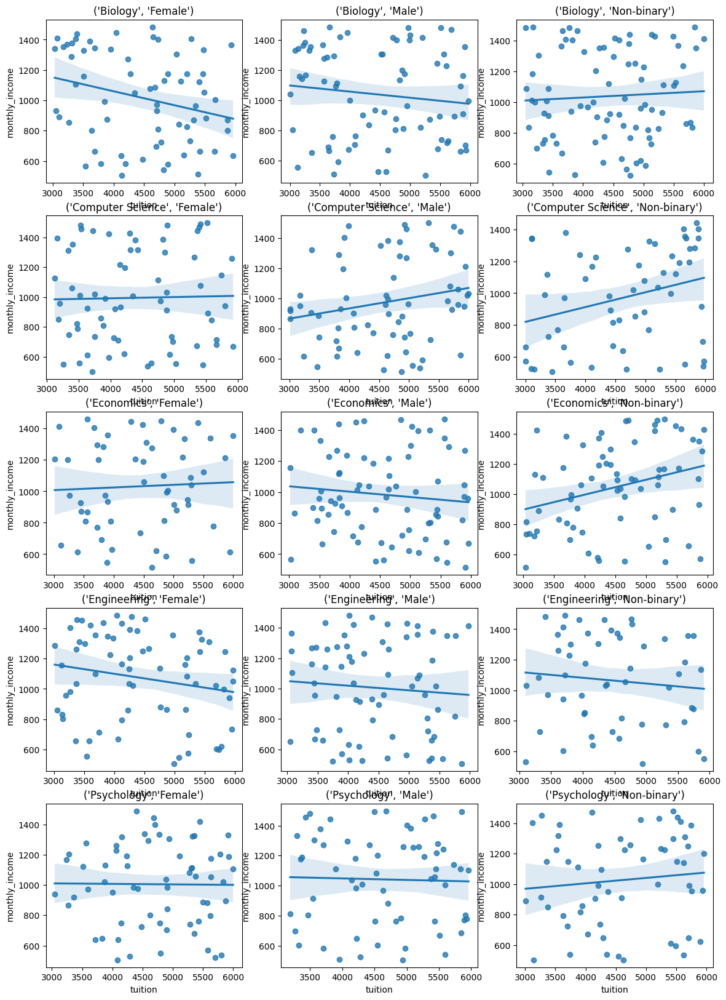

In [256]:
groups = spending.groupby(['major','gender'])
plotcols = 3
fig, axs = plt.subplots(groups.ngroups//plotcols, plotcols, figsize=(14, 20))
j=0
for i in groups:
    sns.regplot(data=i[1], x='monthly income', y='tuition',
                ax = axs[j//plotcols,j%plotcols])
    axs[j//plotcols,j%plotcols].set_title(i[0])
    j+=1

45


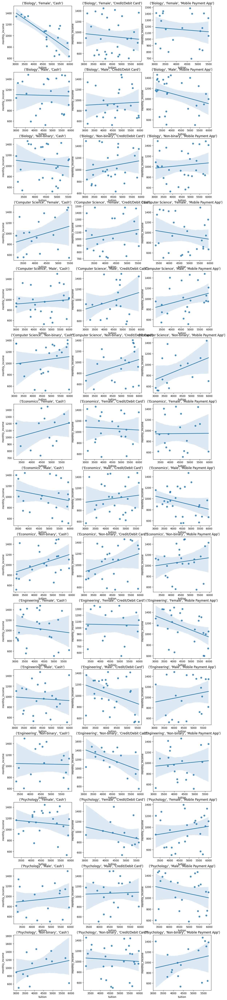

In [258]:
groups = spending.groupby(['major','gender', 'preferred_payment_method'])
plotcols = 3
fig, axs = plt.subplots(groups.ngroups//plotcols, plotcols, figsize=(14, 70))
j=0
print(groups.ngroups)
for i in groups:
    sns.regplot(data=i[1], x='monthly income', y='tuition',
                ax = axs[j//plotcols,j%plotcols])
    axs[j//plotcols,j%plotcols].set_title(i[0])
    j+=1

In [268]:
spending.columns

Index(['entry', 'age', 'gender', 'year_in_school', 'major', 'monthly_income',
       'financial_aid', 'tuition', 'housing', 'food', 'transportation',
       'books_supplies', 'entertainment', 'personal_care', 'technology',
       'health_wellness', 'miscellaneous', 'preferred_payment_method'],
      dtype='object')

In [370]:
groups = spending.groupby(['major', 'preferred_payment_method','age'])
print(groups.ngroups, ' groups \n')
def print_stuff(group_name, model):
    print(model.fit().rsquared.round(2), '     ',
    (model.fit().scale**0.5).round(2), '     ',
    model.fit().params.iloc[1].round(2), '     ',
    model.fit().pvalues.values[1].round(3), '      ',
    model.formula, '     ', group_name[0], '   ', model.nobs)
print('R^2       SEE         slope      slope_p        formula                        group                        nobs')
for i in groups:
    mod = smf.ols('tuition ~ monthly_income', data = i[1])
    print_stuff(i, mod)
    mod = smf.ols('housing ~ monthly_income', data = i[1])
    print_stuff(i, mod)
    mod = smf.ols('financial_aid ~ monthly_income', data = i[1])
    print_stuff(i, mod)
    mod = smf.ols('food ~ monthly_income', data = i[1])
    print_stuff(i, mod)
    mod = smf.ols('technology ~ monthly_income', data = i[1])
    print_stuff(i, mod)

120  groups 

R^2       SEE         slope      slope_p        formula                        group                        nobs
0.0       1064.15       -0.05       0.966        tuition ~ monthly_income       ('Biology', 'Cash', 18)     11.0
0.06       218.91       -0.17       0.482        housing ~ monthly_income       ('Biology', 'Cash', 18)     11.0
0.18       285.86       0.42       0.191        financial_aid ~ monthly_income       ('Biology', 'Cash', 18)     11.0
0.12       85.79       -0.1       0.3        food ~ monthly_income       ('Biology', 'Cash', 18)     11.0
0.16       51.82       -0.07       0.226        technology ~ monthly_income       ('Biology', 'Cash', 18)     11.0
0.43       714.13       -2.94       0.078        tuition ~ monthly_income       ('Biology', 'Cash', 19)     8.0
0.04       117.57       0.12       0.63        housing ~ monthly_income       ('Biology', 'Cash', 19)     8.0
0.15       383.95       -0.78       0.335        financial_aid ~ monthly_income       

C:\Users\THW\Desktop\pycproj\STATS\venv\lib\site-packages\statsmodels\regression\linear_model.py:1717: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
C:\Users\THW\Desktop\pycproj\STATS\venv\lib\site-packages\statsmodels\regression\linear_model.py:1717: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
C:\Users\THW\Desktop\pycproj\STATS\venv\lib\site-packages\statsmodels\regression\linear_model.py:1717: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
C:\Users\THW\Desktop\pycproj\STATS\venv\lib\site-packages\statsmodels\regression\linear_model.py:1717: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
C:\Users\THW\Desktop\pycproj\STATS\venv\lib\site-packages\statsmodels\regression\linear_model.py:1717: RuntimeWarning: divide by zero encountered in scalar 

0.08       993.42       -1.13       0.404        tuition ~ monthly_income       ('Computer Science', 'Cash', 24)     11.0
0.05       131.38       0.12       0.505        housing ~ monthly_income       ('Computer Science', 'Cash', 24)     11.0
0.01       264.79       0.11       0.758        financial_aid ~ monthly_income       ('Computer Science', 'Cash', 24)     11.0
0.01       97.41       0.03       0.795        food ~ monthly_income       ('Computer Science', 'Cash', 24)     11.0
0.32       70.95       -0.19       0.072        technology ~ monthly_income       ('Computer Science', 'Cash', 24)     11.0
0.14       705.81       1.06       0.265        tuition ~ monthly_income       ('Computer Science', 'Cash', 25)     11.0
0.02       173.66       -0.1       0.665        housing ~ monthly_income       ('Computer Science', 'Cash', 25)     11.0
0.25       255.97       -0.56       0.12        financial_aid ~ monthly_income       ('Computer Science', 'Cash', 25)     11.0
0.01       87.25    

In [313]:
spending.columns

Index(['entry', 'age', 'gender', 'year_in_school', 'major', 'monthly_income',
       'financial_aid', 'tuition', 'housing', 'food', 'transportation',
       'books_supplies', 'entertainment', 'personal_care', 'technology',
       'health_wellness', 'miscellaneous', 'preferred_payment_method'],
      dtype='object')

<Axes: xlabel='major', ylabel='monthly_income'>

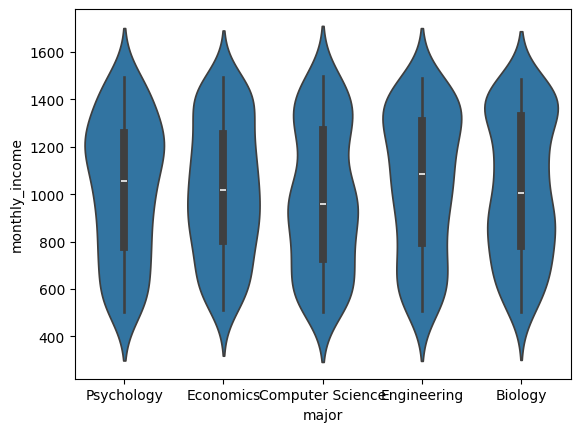

In [312]:
sns.violinplot(data=spending, x="major", y="monthly_income")

<Axes: xlabel='major', ylabel='tuition'>

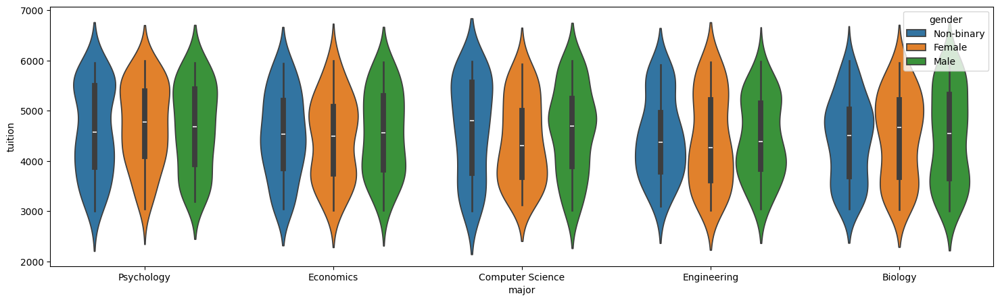

In [317]:
plt.subplots(figsize=(18,5))
sns.violinplot(data=spending, x="major", y="tuition", hue = 'gender')

<Axes: xlabel='major', ylabel='monthly_income'>

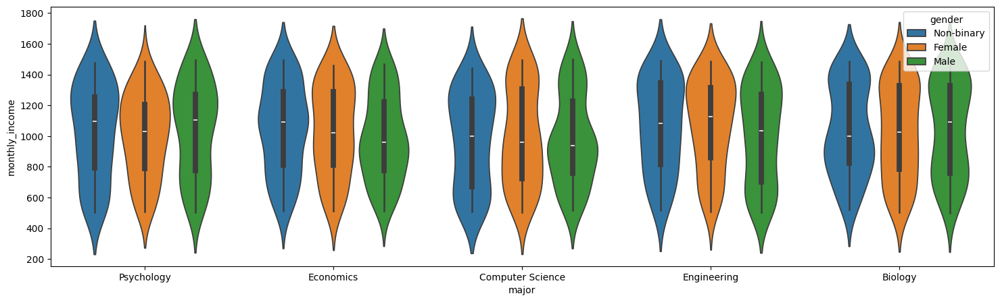

In [321]:
plt.subplots(figsize=(18,5))
sns.violinplot(data=spending, x="major", y="monthly_income", hue = 'gender')

<Axes: xlabel='major', ylabel='financial_aid'>

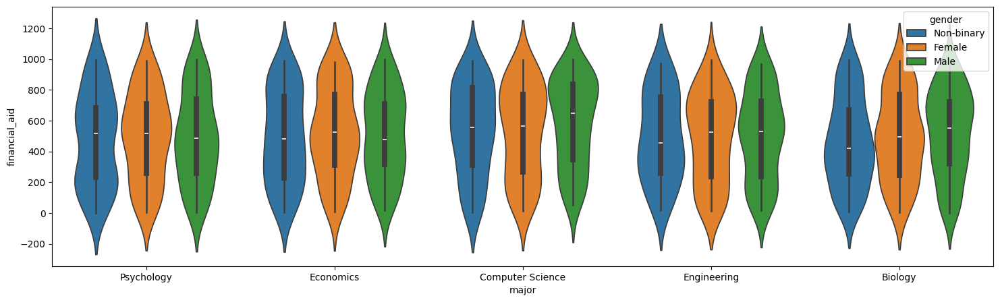

In [318]:
plt.subplots(figsize=(18,5))
sns.violinplot(data=spending, x="major", y="financial_aid", hue = 'gender')

<Axes: xlabel='age', ylabel='housing'>

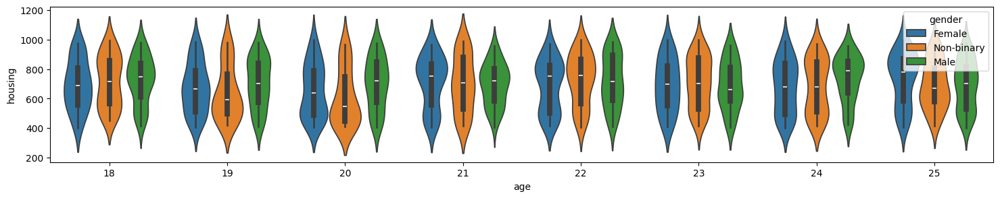

In [323]:
plt.subplots(figsize=(18,3))
sns.violinplot(data=spending, x="age", y="housing", hue = 'gender')

<Axes: xlabel='age', ylabel='housing'>

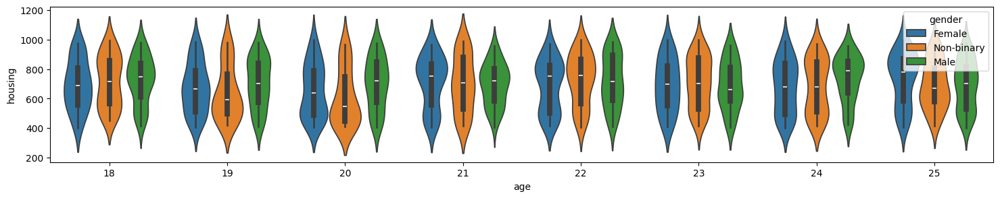

In [322]:
plt.subplots(figsize=(18,3))
sns.violinplot(data=spending, x="age", y="housing", hue = 'gender')

<Axes: xlabel='age', ylabel='food'>

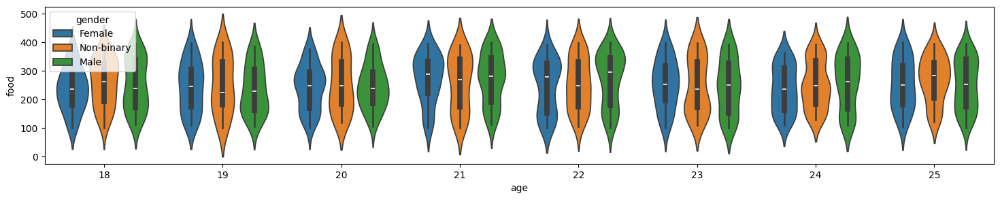

In [324]:
plt.subplots(figsize=(18,3))
sns.violinplot(data=spending, x="age", y="food", hue = 'gender')

<Axes: xlabel='preferred_payment_method', ylabel='monthly_income'>

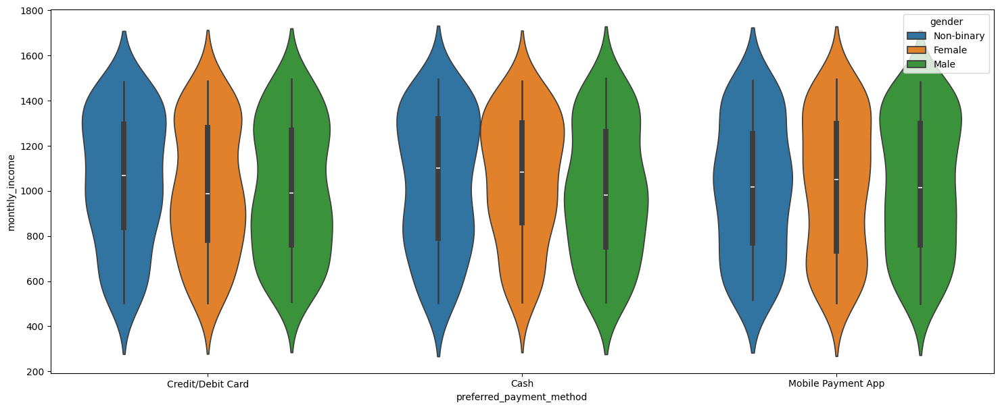

In [326]:
plt.subplots(figsize=(18,7))
sns.violinplot(data=spending, x="preferred_payment_method", y="monthly_income", hue = 'gender')

<Axes: xlabel='preferred_payment_method', ylabel='tuition'>

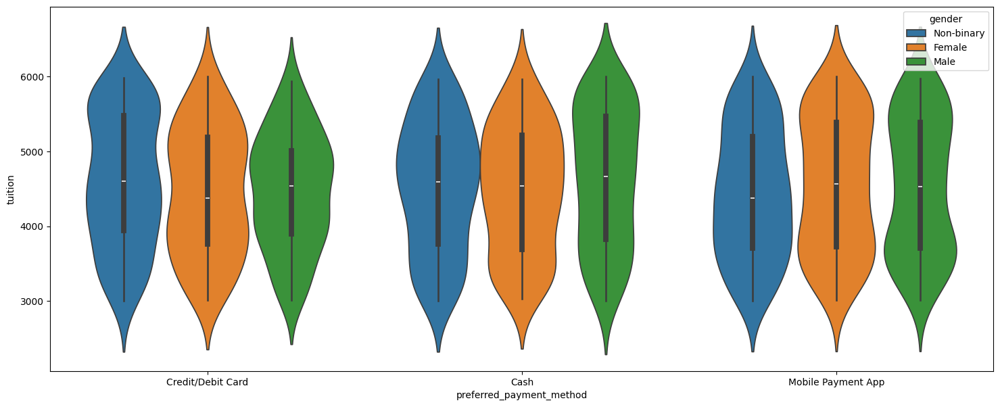

In [327]:
plt.subplots(figsize=(18,7))
sns.violinplot(data=spending, x="preferred_payment_method", y="tuition", hue = 'gender')

<Axes: xlabel='preferred_payment_method', ylabel='financial_aid'>

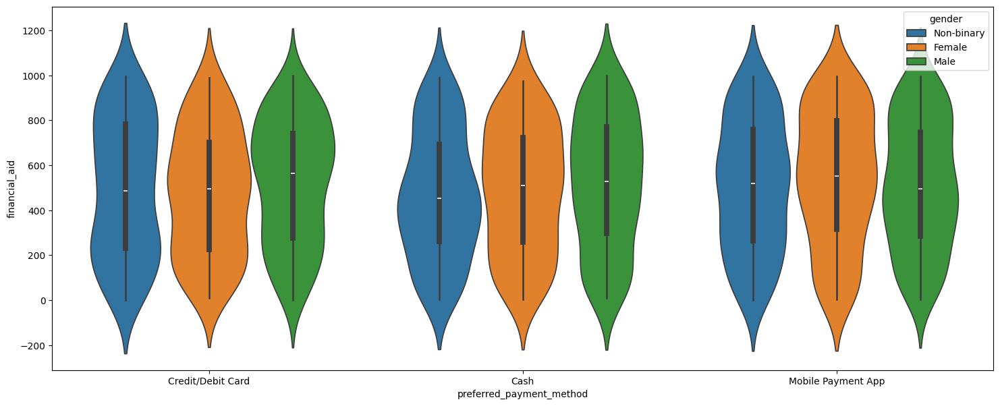

In [328]:
plt.subplots(figsize=(18,7))
sns.violinplot(data=spending, x="preferred_payment_method", y="financial_aid", hue = 'gender')

<Axes: xlabel='preferred_payment_method', ylabel='housing'>

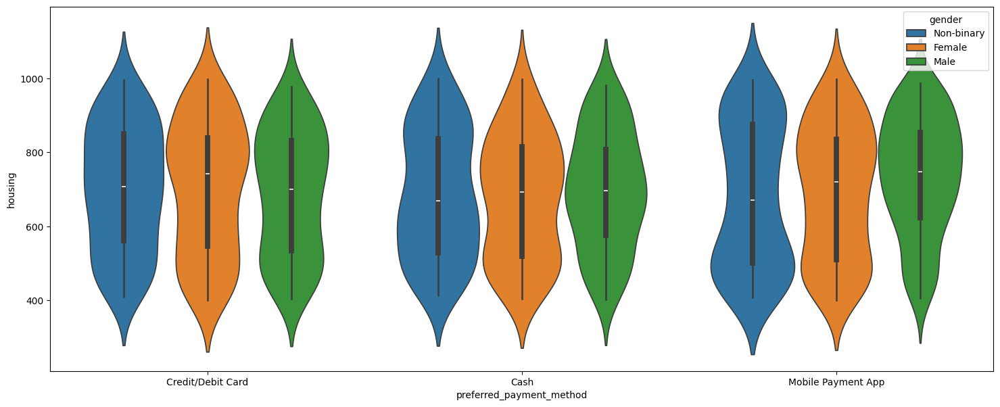

In [329]:
plt.subplots(figsize=(18,7))
sns.violinplot(data=spending, x="preferred_payment_method", y="housing", hue = 'gender')

<Axes: xlabel='preferred_payment_method', ylabel='food'>

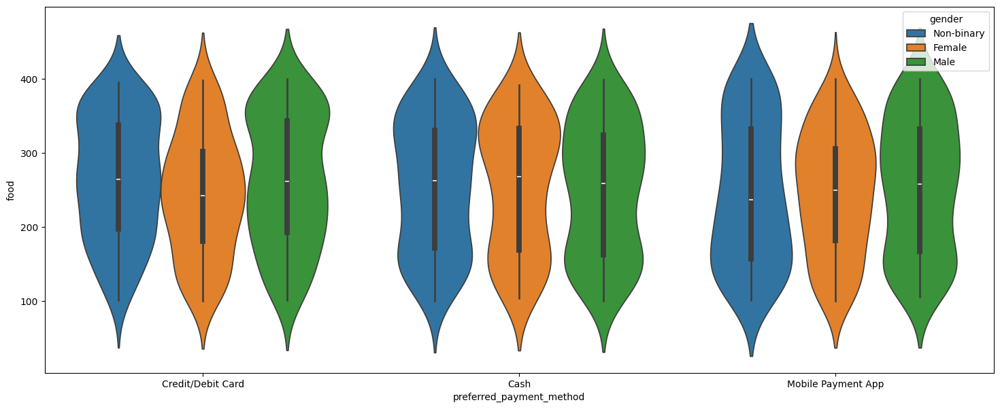

In [330]:
plt.subplots(figsize=(18,7))
sns.violinplot(data=spending, x="preferred_payment_method", y="food", hue = 'gender')

<Axes: xlabel='preferred_payment_method', ylabel='transportation'>

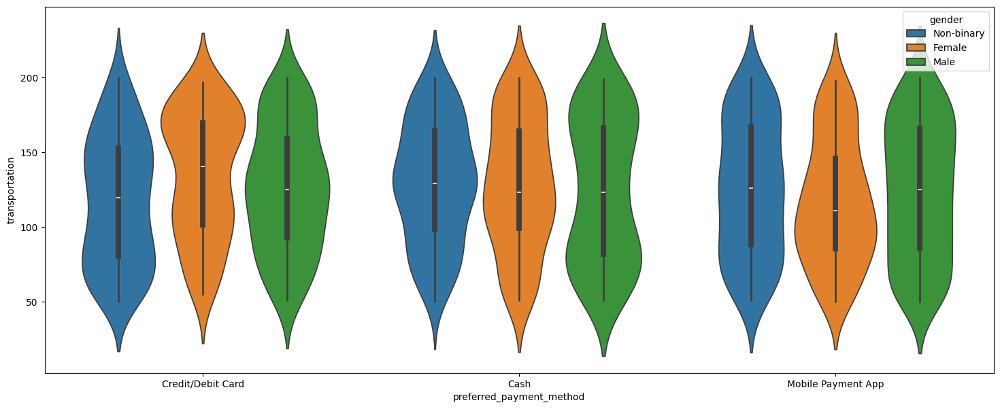

In [331]:
plt.subplots(figsize=(18,7))
sns.violinplot(data=spending, x="preferred_payment_method", y="transportation", hue = 'gender')

<Axes: xlabel='preferred_payment_method', ylabel='entertainment'>

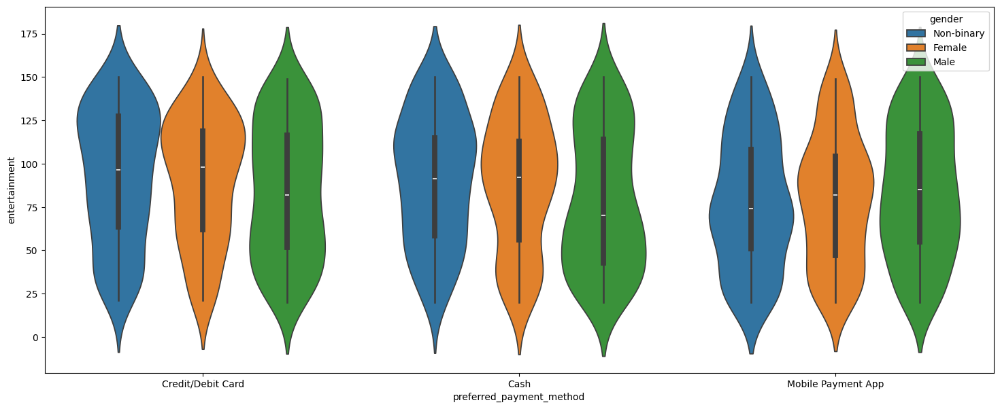

In [332]:
plt.subplots(figsize=(18,7))
sns.violinplot(data=spending, x="preferred_payment_method", y="entertainment", hue = 'gender')

<Axes: xlabel='preferred_payment_method', ylabel='technology'>

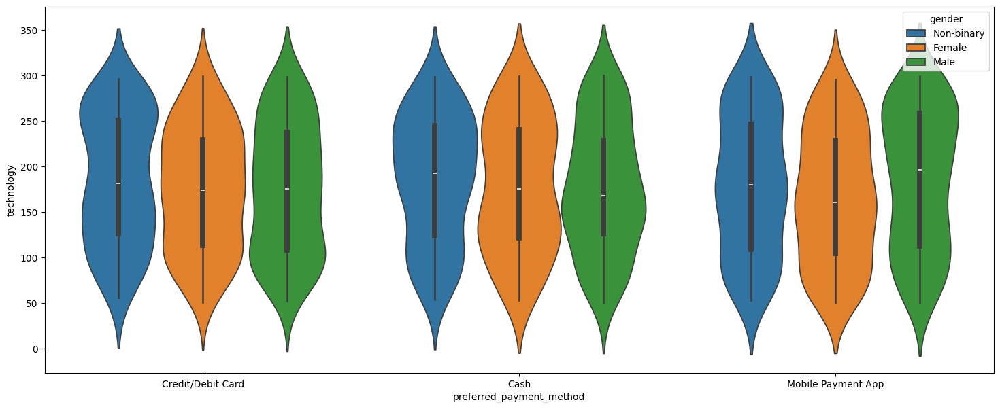

In [333]:
plt.subplots(figsize=(18,7))
sns.violinplot(data=spending, x="preferred_payment_method", y="technology", hue = 'gender')